## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## Описание данных
Файл moscow_places.csv:

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
seats — количество посадочных мест.

## Загрузка данных и подготовка их к анализу

In [1]:
# импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math as mth
import datetime as dt
from scipy import stats as st
from plotly import graph_objects as go
import plotly.express as px
import seaborn as sns
import re
from folium import Map, Choropleth
from folium import Marker
import json

In [2]:
# чтение файлов с данными
try:
    data = pd.read_csv('/datasets/moscow_places.csv.')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Приведем строчные столбцы к нижними регистру:

In [5]:
data['name'] = data['name'].str.lower()
data['category'] = data['category'].str.lower()
data['address'] = data['address'].str.lower()
data['district'] = data['district'].str.lower()
data['price'] = data['price'].str.lower()
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
#Проверка на явные дубликаты
data.duplicated().sum()

0

In [7]:
#data.duplicated()(subset=['name', 'address'])
#data.info()


In [8]:
# код ревьюера
data['name'] = data['name'].str.lower()
data.duplicated(subset=['name', 'address']).sum()

4

In [9]:
# код ревьюера
data[data.duplicated(subset=['name', 'address'],  keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",северо-восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",северо-восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


## Предобработка данных

Создадим столбец `street` с названиями улиц из столбца с адресом.

In [10]:
#words = ['улица', ' ул.','шоссе', 'проспект', 'мкад','бульвар', 'проезд','округ', 'заказник', 'набережная',
#         'переулок', 'площадь', 'квартал','кольцо', 'тупик', 'аллея', 'сквер', 'парк', 'просек', 'линия', 'мост', 'пр-т']
#str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
#data['street'] = data['address'].str.extract(str_pat, flags=re.I)
# какое же это зло, регулярные выражения

data['street'] = data.address.str.split(', ').str[1]

Создим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [11]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно' 

In [12]:
#Проверка на пропускми
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
street                  0
is_24/7                 0
dtype: int64

Пропуски присуствуют в 6 столбцах. Ни один из них нельзя дозаполнить за адекватное время.

In [13]:
# код ревьюера
data.isna().mean().round(4).to_frame().sort_values(by=0).style.format('{:.2%}').background_gradient('coolwarm')

,0
name,0.00%
category,0.00%
address,0.00%
district,0.00%
lat,0.00%
lng,0.00%
rating,0.00%
chain,0.00%
street,0.00%
is_24/7,0.00%


## Анализ данных

### Посмотрим какие категории заведений представлены в данных

In [14]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [15]:
count_cafe = data.groupby('category',as_index=False)['address'].count().sort_values(by='address', ascending=True)

fig = px.bar(count_cafe,
             x='address',
             y='category',
             text='address' 
                               
            )

fig.update_layout(title='Количество объектов общественного питания по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Тип заведения')
fig.show()

<div class="alert alert-success"; style="border-left: 7px solid green">
<font size='4'><b>👍 Комментарий ревьюера</b></font>

Столбиковая диаграмма – оптимальный тип графика, есть заголовок и подписи к осям – молодец!

</div>

Самыми распространенными типами заведений являются **кафе и рестораны**, далее с некоторым отставанием следуют **кафейни**. Самыми менее распространненными являются **булочные и столовые**.

### Исследуем количество посадочных мест в заведениях по категориям

In [16]:
#выберем только те места где указанно количество мест
seats_by = data.query('seats > 0').groupby('category',as_index=False)['seats'].median().sort_values(by='seats', ascending=True)
fig = px.bar(seats_by,
             x='seats',
             y='category',
             text='seats' 
                               
            )

fig.update_layout(title='Медианное количество посадочных мест в местах по категориям',
                   xaxis_title='Количество мест',
                   yaxis_title='Тип заведения')
fig.show()

<div class="alert alert-success"; style="border-left: 7px solid green">
<font size='4'><b>👍 Комментарий ревьюера</b></font>

Действительно, когда в данных есть выбросы, лучше использовать медианы
</div>

Наибольшее число посадочных мест в **ресторанах, барах/пабах, столовых и кофейнях**, наименьшее в **булочных, пиццериях и кафе**.

<div class="alert alert-success"; style="border-left: 7px solid green">
<font size='4'><b>👍 Комментарий ревьюера</b></font>

Все логично
</div>

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений

In [17]:
chain_places = data.groupby('chain',as_index=False)['address'].count()
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain_places['address'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

Большинство заведений почти 62% являются несетевыми.

<div class="alert alert-success"; style="border-left: 7px solid green">
<font size='4'><b>👍 Комментарий ревьюера</b></font>

Верно
</div>

### Рассмотрим категории заведений чаще являющиеся сетевыми.

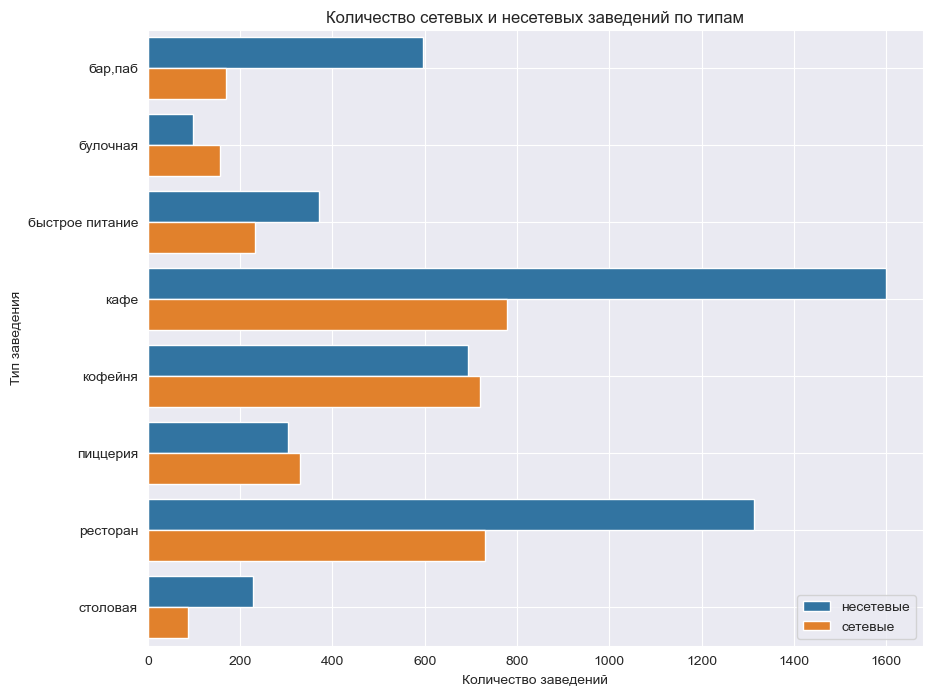

In [18]:
chain_by_type = data.groupby(['category','chain'],as_index = False)['address'].count()
chain_by_type['chain'] = chain_by_type['chain'].apply(lambda x: 'сетевые' if x==1 else 'несетевые')
sns.set_style('dark')
plt.figure(figsize=(10, 8)) 
sns.barplot(x='address', y='category', data=chain_by_type, hue='chain')
plt.title('Количество сетевых и несетевых заведений по типам')
plt.xlabel('Количество заведений')
plt.ylabel('Тип заведения')
plt.labels=['несетевые', 'сетевые']
plt.legend(loc='lower right', fontsize=10)
plt.grid()
plt.show()


Чаще всего сетевыми являются заведения типа **булочная, кофейня и пиццерия**.

In [19]:
chain_places = data.groupby('category', as_index=False).agg({'chain' : 'sum','address' : 'count'})
chain_places['%'] = round(chain_places['chain']/chain_places['address']*100,0)
fig = px.bar(chain_places.sort_values(by='%', ascending=True),
             x='%',
             y='category',
             text='%' 
                               
            )

fig.update_layout(title='Процент сетевых заведений от общего данного типа',
                   xaxis_title='Процент',
                   yaxis_title='Тип заведения')
fig.show()

<div class="alert alert-block alert-info">

### Комментарий студента: 
Как то так

</div>

<div class="alert alert-success"; style="border-left: 7px solid green">
<font size='4'><b>👍 Комментарий ревьюера 2</b></font>

Отлично!
</div>

###  Топ-15 популярных сетей в Москве

In [20]:
top15_chain = data.query('chain == 1').groupby(['name'],as_index = False)['address'].count().sort_values(by='address', ascending=False).head(15)
top15_chain

,name,address
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


<div class="alert alert-success"; style="border-left: 7px solid green">
<font size='4'><b>👍 Комментарий ревьюера</b></font>

Сразу отфильтровал по параметру chain, не получил лишние наблюдения с одинаковыми названиями
</div>

In [21]:
fig = px.bar(top15_chain.sort_values(by='address', ascending=True),
             x='address',
             y='name',
             text='address',
             color_discrete_sequence= ['green']
             
                               
            )

fig.update_layout(title='Топ-15 популярных сетей',
                   xaxis_title='Количество объектов',
                   yaxis_title='Название заведения')
fig.show()

Самым популярным сетевым заведением является кофейня "Шоколадница", далее 2 пиццерии "Доминос пицца" и "Додо пицца". Большинство заведений в топ-15 кофейни.

<div class="alert alert-success"; style="border-left: 7px solid green">
<font size='4'><b>👍 Комментарий ревьюера</b></font>

Тут все супер
</div>

### Общее количество заведений и количество заведений каждой категории по районам

In [22]:
places_by_area = data.groupby(['district','category'], as_index=False).agg(
    count_object=('address', 'count')).sort_values(by=['count_object', 'district'], ascending=False)
fig = px.bar(places_by_area,
             x='count_object',
             y='district',
             color='category',
             title='Количество заведений каждой категории по округам',
             text=places_by_area['count_object'])
 
fig.update_layout(
    yaxis_title="Округ",
    xaxis_title="Количество",
    yaxis=dict(
        tickmode='array',
        tickvals=places_by_area['district'],
        ticktext=places_by_area['district']
    ),
    legend_title='Категории заведений',
    autosize=False, 
    width=1000, height=500
)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Большинство заведений расположены в ЦАО, наименьшее в СЗАО.

### Распределение средних рейтингов по категориям заведений.

In [23]:
places_by_rating= data.groupby(['category'],as_index = False)['rating'].median().sort_values(by='rating', ascending=True)
fig = px.bar(places_by_rating,
             x='rating',
             y='category',
             text='rating' 
                               
            )

fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Тип заведения')
fig.show()

По категориям заведений рейтинг отличается совсем немного, всего на 0,2 единицы.


### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [24]:
hoproplet_rating = data.groupby(['district'],as_index = False)['rating'].median().sort_values(by='rating', ascending=True)
hoproplet_rating

,district,rating
3,северо-восточный административный округ,4.2
6,юго-восточный административный округ,4.2
0,восточный административный округ,4.3
1,западный административный округ,4.3
2,северный административный округ,4.3
4,северо-западный административный округ,4.3
7,юго-западный административный округ,4.3
8,южный административный округ,4.3
5,центральный административный округ,4.4


In [25]:
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [26]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=hoproplet_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Все заведения датасета на карте с помощью кластеров

In [27]:
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

In [28]:
top15_streets = data.groupby(['street'], as_index=False).agg(
    count_object=('name', 'count')).sort_values(by=['count_object', 'street'], ascending=False).head(15)
list_of_streets = top15_streets['street'].tolist()
top15_streets2 = data[data['street'].isin(list_of_streets)].groupby(['street', 'category'], as_index=False).agg(
    count_object=('name', 'count')).sort_values(by=['street'], ascending=False)

In [29]:
fig = px.bar(top15_streets2,
             x='count_object',
             y='street',
             color='category',
             title='Топ-15 улиц по количеству заведений',
             text=top15_streets2['count_object'])
 
fig.update_layout(
    yaxis_title="Название",
    xaxis_title="Количество",
    yaxis=dict(
        tickmode='array',
        tickvals=top15_streets2['street'],
        ticktext=top15_streets2['street']
    ),
    legend_title='Категории заведений',
    autosize=False, 
    width=1200, height=500
)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Самое большое количество заведений находится на Проспекте мира, Профсоюзной улице и проспекте Вернадского.

###  Улицы, на которых находится только один объект общепита

In [30]:
only1 = data.groupby(['street'], as_index=False).agg(
    count_object=('name', 'count')).query('count_object == 1')
list_of_one = only1['street'].tolist()
only1_list = data[data['street'].isin(list_of_one)].groupby(['street', 'category','district'], as_index=False).agg(
    count_object=('name', 'count'))
only1_list.sample(15)

,street,category,district,count_object
169,каланчёвская улица,ресторан,центральный административный округ,1
371,улица грекова,кофейня,северо-восточный административный округ,1
79,6-й лучевой просек,быстрое питание,восточный административный округ,1
237,ордынский тупик,кофейня,центральный административный округ,1
272,полоцкая улица,ресторан,западный административный округ,1
145,дендропарковая улица,кафе,южный административный округ,1
249,парк зюзино,булочная,юго-западный административный округ,1
336,троилинский переулок,ресторан,центральный административный округ,1
410,улица раевского,кафе,западный административный округ,1
335,триумфальная площадь,ресторан,центральный административный округ,1


In [31]:
only1_by_category = only1_list.groupby('category',as_index=False)['street'].count().sort_values(by='street', ascending=True)
only1_by_category

,category,street
1,булочная,8
5,пиццерия,15
2,быстрое питание,23
7,столовая,36
0,"бар,паб",39
4,кофейня,84
6,ресторан,93
3,кафе,159


In [32]:
fig = px.bar(only1_by_category,
             x='street',
             y='category',
             text='street' 
                               
            )

fig.update_layout(title='Количество объектов по типам, которые одни на улице',
                   xaxis_title='Количество заведений',
                   yaxis_title='Тип заведения')
fig.show()

In [33]:
#Общее количество
only1_list['street'].count()

457

Улиц на которых находится только один объект 457 штук. Большинство из них кафе рестораны и кофейни. 

In [34]:
only1_list_by_district = only1_list.groupby('district',as_index=False)['street'].count().sort_values(by='street', ascending=True)
fig = px.bar(only1_list_by_district,
             x='street',
             y='district',
             text='street' 
                               
            )

fig.update_layout(title='Количество объектов по округам, которые одни на улице',
                   xaxis_title='Количество заведений',
                   yaxis_title='Округ')
fig.show()

Большинство объектов питания которые находятся одни на улице расположенны в ЦАО, далее с большим отрывом почти в 3 раза идут СВАО, ВАО и САО.

### Оценка среднего чека

В колонке `middle_avg_bill` много пропусков, заполнить его не представляется возможным, поэтому возмем срез только по тем местам, где это пооле заполненно.

In [35]:
data_with_avg_bill = data.query('middle_avg_bill > 0')
data_with_avg_bill.sample(15)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
5357,покемо,ресторан,"москва, электродная улица, 2, стр. 32",восточный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–22:50; вс 11:00...",55.754474,37.752563,4.4,средние,Средний счёт:700–1400 ₽,1050.0,NaN,0,90.0,электродная улица,False
4416,бобры и утки,"бар,паб","москва, чистопрудный бульвар, 1а",центральный административный округ,"ежедневно, круглосуточно",55.764697,37.639730,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,60.0,чистопрудный бульвар,True
4323,кафе m-city,ресторан,"москва, пресненская набережная, 2",центральный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.749397,37.540221,3.9,выше среднего,Средний счёт:650–2000 ₽,1325.0,NaN,0,350.0,пресненская набережная,False
1061,додо пицца,пиццерия,"москва, енисейская улица, 22, корп. 2",северо-восточный административный округ,"пн-пт 07:00–23:00; сб,вс 09:00–23:00",55.868915,37.664914,4.3,NaN,Средний счёт:404 ₽,404.0,NaN,1,225.0,енисейская улица,False
5020,закарпатские узоры,ресторан,"москва, школьная улица, 21",центральный административный округ,"ежедневно, 11:00–00:00",55.745683,37.671736,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,60.0,школьная улица,False
2249,кулинарная лавка братьев караваевых,кафе,"москва, улица щепкина, 33",центральный административный округ,"ежедневно, 08:00–23:00",55.779698,37.628879,4.4,средние,Средний счёт:400–900 ₽,650.0,NaN,1,100.0,улица щепкина,False
7076,южная ночь,быстрое питание,"москва, профсоюзная улица, 56",юго-западный административный округ,"ежедневно, 12:00–23:00",55.670021,37.552480,4.2,выше среднего,Средний счёт:1200 ₽,1200.0,NaN,0,86.0,профсоюзная улица,False
5654,coffee party,кафе,"москва, верейская улица, 29, стр. 154",западный административный округ,пн-пт 09:00–19:00,55.710143,37.442499,4.2,средние,Средний счёт:300–500 ₽,400.0,NaN,1,NaN,верейская улица,False
900,"мама, я в тбилиси",ресторан,"москва, енисейская улица, 9а",северо-восточный административный округ,"ежедневно, 12:00–23:00",55.864712,37.661296,4.4,средние,Средний счёт:900–1000 ₽,950.0,NaN,0,45.0,енисейская улица,False
3377,кафе арбат,ресторан,"москва, улица ивана франко, 12",западный административный округ,пн-пт 13:00–15:00,55.728088,37.442387,4.3,средние,Средний счёт:200–350 ₽,275.0,NaN,0,40.0,улица ивана франко,False


Посчитаем медиану этого столбца для каждого района:

In [36]:
data_with_avg_bill_hoproplet_rating = data_with_avg_bill.groupby('district',as_index=False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill', ascending=False)
data_with_avg_bill_hoproplet_rating

,district,middle_avg_bill
1,западный административный округ,1000.0
5,центральный административный округ,1000.0
4,северо-западный административный округ,700.0
2,северный административный округ,650.0
7,юго-западный административный округ,600.0
0,восточный административный округ,575.0
3,северо-восточный административный округ,500.0
8,южный административный округ,500.0
6,юго-восточный административный округ,450.0


Построим фоновую картограмму (хороплет) с полученными значениями для каждого района

In [37]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_with_avg_bill_hoproplet_rating,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианные цены заведений по районам',
).add_to(m)

# выводим карту
m

Медианные цены в ЦАО и ЗАО самые дорогие, с отдаленными районами СВАО, ЮАО и ЮВАО отличаются почти в 2 раза. Можно смело сказать что чем дальше от центра - тем дешевле стоимость посещения. 

### Обшие выводы:

1. Самымми распростанеными видами заведений в исследуемых данных являются кафе, около 28% от общего числа. Далее следуют рестораны - 25% и кофейни - 17%. Меньше всего булочных - 4% и столовых 3%
2. Наибольшее число посадочных мест в ресторанах, барах/пабах, столовых и кофейнях, наименьшее в булочных, пиццериях и кафе.
3. Большинство заведений почти 62% являются несетевыми. Чаще всего сетевыми являются заведения типа булочная, кофейня и пиццерия.
4. Самым популярным сетевым заведением является кофейня "Шоколадница", далее 2 пиццерии "Доминос пицца" и "Додо пицца". Большинство заведений в топ-15 кофейни.
5. Большинство заведений расположены в ЦАО более чем в 2 раза выше по сравненению со следующим округом - ЮАО, связанно это с большой проходимостью. Наименьшее в СЗАО.
6. Наивысший средний рейтинг у заведенмий типа "бар/паб" - 4.3 балла. Далее следуют  столовые, рестораны, пиццерии, кофейни и булочные с рейтингом 4.2. По категориям заведений рейтинг отличается совсем немного, всего на 0,2 единицы.
7. Из топа-15 улиц по количеству заведений самое большое количество находится на Проспекте мира, Профсоюзной улице и проспекте Вернадского. Наименьшее - на Пятницкой улице, Микклухе-Маклая и Кутузовском проспекте.
8. Большинство объектов питания которые находятся одни на улице расположенны в ЦАО собственно как и общее количество заведений в данном округе, далее с большим отрывом почти в 3 раза идут СВАО, ВАО и САО.
9. Медианные цены в ЦАО и ЗАО самые дорогие, с отдаленными районами СВАО, ЮАО и ЮВАО отличаются почти в 2 раза. Можно смело сказать что чем дальше от центра - тем дешевле стоимость посещения. 


## Детализируем исследование: открытие кофейни

В датасете представленны 1413 кофеин, что является 17% от общего числа заведений. 

In [38]:
coffee = data.query('category == "кофейня"')
places_is_24 = coffee.groupby('is_24/7', as_index=False)['address'].count()
fig = go.Figure(data=[go.Pie(labels=['некруглосуточные', 'круглосуточные'], values=places_is_24['address'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение круглосуточных кофеин к некруглосуточным")))
fig.show()

Только 4% кофеин работают круглосуточно

In [39]:
coffee_amount = coffee.groupby(['district'],as_index = False)['address'].count().sort_values(by='address', ascending=True)
fig = px.bar(coffee_amount,
             x='address',
             y='district',
             text='address' 
                               
            )

fig.update_layout(title='Распределение количества кофеин по округам',
                   xaxis_title='Количества',
                   yaxis_title='Округ')
fig.show()


In [40]:
coffee_rating = coffee.groupby(['district'],as_index = False)['rating'].median().sort_values(by='rating', ascending=True)
fig = px.bar(coffee_rating,
             x='rating',
             y='district',
             text='rating' 
                               
            )

fig.update_layout(title='Распределение рейтингов кофеин по округам',
                   xaxis_title='Рейтинг',
                   yaxis_title='Округ')
fig.show()

In [41]:
middle_coffee_cup_is_here = coffee.query('middle_coffee_cup == middle_coffee_cup')
middle_coffee_cup_is_here_distr = middle_coffee_cup_is_here.groupby(['district'],as_index = False)['middle_coffee_cup'].median().sort_values(by='middle_coffee_cup', ascending=True)
fig = px.bar(middle_coffee_cup_is_here_distr,
             x='middle_coffee_cup',
             y='district',
             text='middle_coffee_cup' 
                               
            )

fig.update_layout(title='Медианная стоимость чашки капучино в зависимости от округа',
                   xaxis_title='Стоимость',
                   yaxis_title='Округ')
fig.show()

В зависимости от округа в котором планируется открытие кофейни можно ориентироваться на стоимость чашки кофе по графику выше

In [42]:
coffee_seats = coffee.query('seats > 0').groupby(['district'],as_index = False)['seats'].median().sort_values(by='seats', ascending=True)

fig = px.bar(coffee_seats,
             x='seats',
             y='district',
             text='seats' 
                               
            )

fig.update_layout(title='Количество мест в зависимости от округа',
                   xaxis_title='Количество мест',
                   yaxis_title='Округ')
fig.show()

В зависимости от округа в котором планируется открытие кофейни можно ориентироваться на количество мест по графику выше

### Рекомендации:

1. Для открытия кофейни выбрать ЦАО как самый проходимый округ, но с максимальной конкуренцией или ЮЗАО, ЗАО - конкуренция сильно ниже, а стоимость чашки каппучино практически такая же высокая.
2. Количество посадочных мест выбрать не более 90.
3. Круглосуточную кофейню делать не стоит.
4. Среднюю цену чашки капучино установить в районе 190 рублей. 

## Ссылка на презентацию

https://disk.yandex.ru/i/utSrJe98QHWJ2g